In [227]:
import os, glob
import sys
import pydicom
import random
import re
import scipy
import scipy.misc
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf
from tensorflow import keras
import numpy as np
import tensorflow as tf 
from keras import backend as K
plt.set_cmap('gray')
%matplotlib inline
## Seeding 
seed = 42
random.seed = seed
np.random.seed = seed
tf.seed = seed


IMG_DTYPE = float
SEG_DTYPE = np.uint8

import tensorflow as tf
import tensorflow.keras.layers as L
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.models import Model 
# from tensorflow.keras.backend import add 
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda, Activation, Reshape
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger, ReduceLROnPlateau, EarlyStopping, TensorBoard
from tensorflow.keras.metrics import Recall, Precision

print(tf.__version__)

2.14.0


<Figure size 640x480 with 0 Axes>

In [228]:
def imshow(*args,**kwargs):
    cmap = kwargs.get('cmap', 'gray')
    title= kwargs.get('title','')
    if len(args)==0:
        raise ValueError("No images given to imshow")
    elif len(args)==1:
        plt.title(title)
        plt.imshow(args[0], interpolation='none')
    else:
        n=len(args)
        if type(cmap)==str:
            cmap = [cmap]*n
        if type(title)==str:
            title= [title]*n
        plt.figure(figsize=(n*5,10))
        for i in range(n):
            plt.subplot(1,n,i+1)
            plt.title(title[i])
            plt.imshow(args[i], cmap[i])
    plt.show()
    
def normalize_image(img):
    """ Normalize image values to [0,1] """
    min_, max_ = float(np.min(img)), float(np.max(img))
    return (img - min_) / (max_ - min_)

In [229]:
def step1_preprocess_img_slice(img_slc):
    """
    Preprocesses the image 3d volumes by performing the following :
    1- Set pixels with hounsfield value great than 1200, to zero.
    2- Clip all hounsfield values to the range [-100, 400]
    3- Apply Histogram Equalization
    """    
    img_slc[img_slc>1200] = 0
    img_slc   = np.clip(img_slc, -100, 400)
    img_slc = normalize_image(img_slc)

    
    img_slc = img_slc * 255
    img_slc = img_slc.astype('uint8')
    img_slc = cv2.equalizeHist(img_slc)
    img_slc = normalize_image(img_slc)
    return img_slc

In [230]:
class DataGen(keras.utils.Sequence):
    def __init__(self, ids, path, batch_size=8, image_size=128):
        self.ids = ids
        self.path = path
        self.batch_size = batch_size
        self.image_size = image_size
        self.on_epoch_end()
        
    def __load__(self, id_name):
        patient_id = id_name.split('_')
        image_path = os.path.join(self.path,"patients", id_name)
        mask_path = os.path.join(self.path,"masks")
        all_masks = os.listdir(mask_path)
        dicom_image = pydicom.dcmread(image_path)
        image = step1_preprocess_img_slice(dicom_image.pixel_array)
        image = normalize_image(image)
        image = np.array(Image.fromarray(image).resize([image_size, image_size])).astype(IMG_DTYPE)
        
        mask = pydicom.dcmread(os.path.join(mask_path,patient_id[0]+'_liver' , id_name)).pixel_array
        mask = mask/255.0
        mask = np.clip(mask, 0, 1)
        mask = np.array(Image.fromarray(mask).resize([image_size, image_size])).astype(IMG_DTYPE)
        mask = mask[:, :, np.newaxis]
        return image, mask
    
    def __getitem__(self, index):
        if(index+1)*self.batch_size > len(self.ids):
            self.batch_size = len(self.ids) - index*self.batch_size
        
        files_batch = self.ids[index*self.batch_size : (index+1)*self.batch_size]

        image = []
        mask  = []
    
        for id_name in files_batch:
            _img, _mask = self.__load__(id_name)
            _img = np.stack((_img,)*3, axis=-1)
            image.append(_img)
            mask.append(_mask)
        
        image = np.array(image)
        mask  = np.array(mask)

        return image, mask
    
    def on_epoch_end(self):
        pass
    
    def __len__(self):
        return int(np.ceil(len(self.ids)/float(self.batch_size)))
    


In [231]:
image_size = 256
train_path = "train"
batch_size = 8
epochs = 50

## Training Ids
images = []
for file in os.listdir(os.path.join(train_path, "patients")):
#     print(file)
    images.append(file)
print(len(images))

val_data_size = len(images)//5

valid_ids = images[:val_data_size]
train_ids = images[val_data_size:]

2823


In [232]:
gen = DataGen(train_ids, train_path, batch_size=batch_size, image_size=image_size)
x, y = gen.__getitem__(0)

3


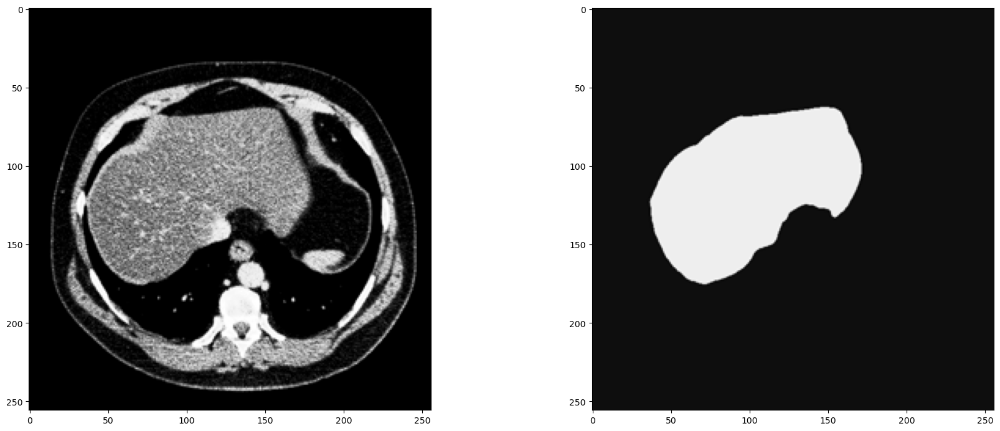

In [233]:
r = random.randint(0, len(x)-1)
fig = plt.figure(figsize=(20,20))
fig.subplots_adjust(hspace=0.4, wspace=0.4)
ax = fig.add_subplot(1, 2, 1)
ax.imshow(x[r])
print(r)
ax = fig.add_subplot(1, 2, 2)
ax.imshow(np.reshape(y[r], (image_size, image_size)), cmap="gray")

In [234]:
def bn_act(x, act=True):
    x = keras.layers.BatchNormalization()(x)
    if act == True:
        x = keras.layers.Activation("relu")(x)
    return x

def conv_block(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    conv = bn_act(x)
    conv = keras.layers.Conv2D(filters, kernel_size, padding=padding, strides=strides)(conv)
    return conv

def stem(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    conv = keras.layers.Conv2D(filters, kernel_size, padding=padding, strides=strides)(x)
    conv = conv_block(conv, filters, kernel_size=kernel_size, padding=padding, strides=strides)
    
    shortcut = keras.layers.Conv2D(filters, kernel_size=(1, 1), padding=padding, strides=strides)(x)
    shortcut = bn_act(shortcut, act=False)
    
    output = keras.layers.Add()([conv, shortcut])
    return output

def residual_block(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    res = conv_block(x, filters, kernel_size=kernel_size, padding=padding, strides=strides)
    res = conv_block(res, filters, kernel_size=kernel_size, padding=padding, strides=1)
    
    shortcut = keras.layers.Conv2D(filters, kernel_size=(1, 1), padding=padding, strides=strides)(x)
    shortcut = bn_act(shortcut, act=False)
    
    output = keras.layers.Add()([shortcut, res])
    return output

def upsample_concat_block(x, xskip):
    u = keras.layers.UpSampling2D((2, 2))(x)
    c = keras.layers.Concatenate()([u, xskip])
    return c

In [235]:
def ResUNet():
    f = [16, 32, 64, 128, 256]
    inputs = keras.layers.Input((image_size, image_size, 3))
    
    ## Encoder
    e0 = inputs
    e1 = stem(e0, f[0])
    e2 = residual_block(e1, f[1], strides=2)
    e3 = residual_block(e2, f[2], strides=2)
    e4 = residual_block(e3, f[3], strides=2)
    e5 = residual_block(e4, f[4], strides=2)
    
    ## Bridge
    b0 = conv_block(e5, f[4], strides=1)
    b1 = conv_block(b0, f[4], strides=1)
    
    ## Decoder
    u1 = upsample_concat_block(b1, e4)
    d1 = residual_block(u1, f[4])
    
    u2 = upsample_concat_block(d1, e3)
    d2 = residual_block(u2, f[3])
    
    u3 = upsample_concat_block(d2, e2)
    d3 = residual_block(u3, f[2])
    
    u4 = upsample_concat_block(d3, e1)
    d4 = residual_block(u4, f[1])
    
    outputs = keras.layers.Conv2D(1, (1, 1), padding="same", activation="sigmoid")(d4)
    model = keras.models.Model(inputs, outputs)
    return model

In [236]:
'''
  Convolutional block with two conv layers and two activation layers
'''
import keras
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras.losses import *

def convBlock(input, filters, kernel, kernel_init='he_normal', act='relu', transpose=True):
  if transpose == False:
    #conv = ZeroPadding2D((1,1))(input)
    conv = Conv2D(filters, kernel, padding = 'same', kernel_initializer = kernel_init)(input)
  else:
    #conv = ZeroPadding2D((1,1))(input)
    conv = Conv2DTranspose(filters, kernel, padding = 'same', kernel_initializer = kernel_init)(input)

  conv = Activation(act)(conv)
  return conv


def convBlock2(input, filters, kernel, kernel_init='he_normal', act='relu', transpose=True):
  if transpose == False:
    conv = Conv2D(filters, kernel, padding = 'same', kernel_initializer = kernel_init)(input)
    conv = Activation(act)(conv)
    conv = Conv2D(filters, kernel, padding = 'same', kernel_initializer = kernel_init)(conv)
    conv = Activation(act)(conv)
  else:
    conv = Conv2DTranspose(filters, kernel, padding = 'same', kernel_initializer = kernel_init)(input)
    conv = Activation(act)(conv)
    conv = Conv2DTranspose(filters, kernel, padding = 'same', kernel_initializer = kernel_init)(conv)
    conv = Activation(act)(conv)

  return conv
  
'''
  Attention block/mechanism
'''
def attention_block(x, gating, inter_shape, drop_rate=0.25):
   
    # Find shape of inputs
    shape_x = K.int_shape(x)
    shape_g = K.int_shape(gating)

    ## Process x vector and gating signal
    # x vector input and processing
    theta_x = Conv2D(inter_shape, kernel_size = 1, strides = 1, padding='same', kernel_initializer='he_normal', activation='softmax')(x)
    theta_x = MaxPooling2D((2,2))(theta_x)
    shape_theta_x = K.int_shape(theta_x)

    # gating signal ""
    phi_g = Conv2D(inter_shape, kernel_size = 1, strides = 1, padding='same', kernel_initializer='he_normal', activation='softmax')(gating)
    shape_phi_g = K.int_shape(phi_g)

    # Add components
    concat_xg = add([phi_g, theta_x])
    act_xg = Activation('relu')(concat_xg)

    # Apply convolution
    psi = Conv2D(1, kernel_size = 1, strides = 1, padding='same', kernel_initializer='he_normal', activation='softmax')(act_xg)

    # Apply sigmoid activation
    sigmoid_xg = Activation('sigmoid')(psi)
    shape_sigmoid = K.int_shape(sigmoid_xg)

    # UpSample and resample to correct size
    upsample_psi = UpSampling2D(interpolation='bilinear', size=(shape_x[1] // shape_sigmoid[1], shape_x[2] // shape_sigmoid[2]))(sigmoid_xg)
    upsample_psi = tf.image.resize(upsample_psi, (shape_x[1], shape_x[2]))  # Resize upsample_psi
    y = multiply([upsample_psi, x])

    return y


'''
  Attention U-Net model
'''

def UNetAM(trained_weights = None, input_size = (256,256,3), drop_rate = 0.25, lr=0.00001, filter_base=16):

    ## Can add pretrained weights by specifying 'trained_weights'

    # Input layer
    inputs = Input(input_size, batch_size=1)

    ## Contraction phase
    conv = convBlock2(inputs, filter_base, 3)
    #conv0 = Dropout(drop_rate)(conv0)

    conv0 = MaxPooling2D(pool_size=(2, 2))(conv)
    conv0 = convBlock2(conv0, 2 * filter_base, 3)

    pool0 = MaxPooling2D(pool_size=(2, 2))(conv0)
    conv1 = convBlock2(pool0, 4 * filter_base, 3)
    #conv1 = Dropout(drop_rate)(conv1)

    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = convBlock2(pool1, 8 * filter_base, 3)
    #conv2 = Dropout(drop_rate)(conv2)

    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = convBlock2(pool2, 16 * filter_base, 3)
    #conv3 = Dropout(drop_rate)(conv3)

    ## Expansion phase
    up4 = (Conv2DTranspose(8 * filter_base, kernel_size=2, strides=2, kernel_initializer='he_normal')(conv3))
    merge4 = attention_block(conv2, conv3, 8 * filter_base, drop_rate) # Attention gate
    conv4 = concatenate([up4, merge4])
    conv4 = convBlock2(conv4, 8 * filter_base, 3)

    up5 = (Conv2DTranspose(4 * filter_base, kernel_size=2, strides=2, kernel_initializer='he_normal')(conv4))
    merge5 = attention_block(conv1, conv4, 4 * filter_base, drop_rate) # Attention gate
    conv5 = concatenate([up5, merge5])
    conv5 = convBlock2(conv5, 4 * filter_base, 3)

#     up6 = (Conv2DTranspose(2 * filter_base, kernel_size=2, strides=2, kernel_initializer='he_normal')(conv5))
#     merge6 = attention_block(conv0, conv5, 2 * filter_base, drop_rate) # Attention gate
#     conv6 = concatenate([up6, merge6])
#     conv6 = convBlock2(conv6, 2 * filter_base, 3)

#     up7 = (Conv2DTranspose(1 * filter_base, kernel_size=2, strides=2, kernel_initializer='he_normal')(conv6))
#     merge7 = attention_block(conv, conv6, 1 * filter_base, drop_rate) # Attention gate
#     conv7 = concatenate([up7, merge7])
#     conv7 = concatenate([up7, conv])
#     conv7 = convBlock2(conv7, 1 * filter_base, 3)

#     ## Output layer
#     out = convBlock(conv7, 1, 1, act='sigmoid')

#     model = Model(inputs, out)

# #     model.compile(optimizer = adam_v2.Adam(learning_rate = lr), loss = binary_crossentropy, metrics = ['accuracy', 'mse'])

#     if trained_weights != None:
#       model.load_weights(trained_weights)

#     return model

In [237]:
smooth = 1e-15

def dice_coef(y_true, y_pred):
    y_true_f = keras.layers.Flatten()(y_true)
    y_pred_f = y_true_f = keras.layers.Flatten()(y_pred)
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)

def iou(y_true,y_pred):
    def f(y_true, y_pred):
        intersection = (y_true * y_pred).sum()
        union = y_true.sum() + y_pred.sum() - intersection
        x = (intersection + 1e-15) / (union + 1e-15)
        x = x.astype(np.float32)
        return x
    return tf.numpy_function(f, [y_true, y_pred], tf.float32)


def dice_coef_loss(y_true, y_pred):
    return 1.0 - dice_coef(y_true, y_pred)

In [238]:
model = ResUNet()
# model = UNetAM()
adam = tf.keras.optimizers.legacy.Adam(learning_rate = 1e-4)
model.compile(optimizer=adam, loss='binary_crossentropy', metrics=["acc", dice_coef,iou, Recall(),Precision()])
model.summary()

Model: "model_9"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_30 (InputLayer)       [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d_499 (Conv2D)         (None, 256, 256, 16)         448       ['input_30[0][0]']            
                                                                                                  
 batch_normalization_196 (B  (None, 256, 256, 16)         64        ['conv2d_499[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_316 (Activation  (None, 256, 256, 16)         0         ['batch_normalization_19

 atchNormalization)                                                                               
                                                                                                  
 conv2d_510 (Conv2D)         (None, 32, 32, 128)          8320      ['add_85[0][0]']              
                                                                                                  
 activation_322 (Activation  (None, 32, 32, 128)          0         ['batch_normalization_205[0][0
 )                                                                  ]']                           
                                                                                                  
 batch_normalization_206 (B  (None, 32, 32, 128)          512       ['conv2d_510[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 conv2d_50

                                                                                                  
 add_88 (Add)                (None, 32, 32, 256)          0         ['batch_normalization_214[0][0
                                                                    ]',                           
                                                                     'conv2d_517[0][0]']          
                                                                                                  
 up_sampling2d_49 (UpSampli  (None, 64, 64, 256)          0         ['add_88[0][0]']              
 ng2D)                                                                                            
                                                                                                  
 concatenate_70 (Concatenat  (None, 64, 64, 320)          0         ['up_sampling2d_49[0][0]',    
 e)                                                                  'add_85[0][0]']              
          

                                                                                                  
 conv2d_527 (Conv2D)         (None, 256, 256, 32)         2592      ['concatenate_72[0][0]']      
                                                                                                  
 activation_334 (Activation  (None, 256, 256, 32)         0         ['batch_normalization_222[0][0
 )                                                                  ]']                           
                                                                                                  
 batch_normalization_223 (B  (None, 256, 256, 32)         128       ['conv2d_527[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 conv2d_526 (Conv2D)         (None, 256, 256, 32)         9248      ['activation_334[0][0]']      
          

In [239]:
# def conv_block(inputs, num_filters):
#     x = Conv2D(num_filters, 3, padding="same")(inputs)
#     x = BatchNormalization()(x)
#     x = Activation("relu")(x)

#     x = Conv2D(num_filters, 3, padding="same")(x)
#     x = BatchNormalization()(x)
#     x = Activation("relu")(x)

#     return x

# def decoder_block(inputs, skip, num_filters):
#     x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(inputs)
#     x = concatenate([x, skip])
#     x = conv_block(x, num_filters)
#     return x

In [240]:
# def build_effienet_unet(input_shape):
#     """ Input """
#     inputs = Input(input_shape)

#     """ Pre-trained Encoder """
#     encoder = EfficientNetB0(include_top=False, weights="imagenet", input_tensor=inputs)

#     s1 = encoder.get_layer("input_12").output                 ## Input shape of EfficientNetB0
#     s2 = encoder.get_layer("block2a_expand_activation").output
#     s3 = encoder.get_layer("block3a_expand_activation").output
#     s4 = encoder.get_layer("block4a_expand_activation").output

#     """ Bottleneck """
#     b1 = encoder.get_layer("block6a_expand_activation").output

#     """ Decoder """
#     d1 = decoder_block(b1, s4, 512)
#     d2 = decoder_block(d1, s3, 256)
#     d3 = decoder_block(d2, s2, 128)
#     d4 = decoder_block(d3, s1, 64)

#     """ Output """
#     outputs = Conv2D(1, 1, padding="same", activation="sigmoid")(d4)

#     model = Model(inputs, outputs, name="EfficientNetB0_UNET")
#     return model

In [241]:
# input_shape = (256,256,3)
# model2 = manet_model(input_shape)
# adam = tf.keras.optimizers.legacy.Adam(learning_rate = 1e-3)
# model2.compile(optimizer=adam, loss='binary_crossentropy', metrics=["acc", dice_coef])
# model2.summary()

In [242]:
# os.environ ['CUDA_VISIBLE_DEVICES'] = '1' 
train_gen = DataGen(train_ids, train_path, image_size=image_size, batch_size=batch_size)
valid_gen = DataGen(valid_ids, train_path, image_size=image_size, batch_size=batch_size)

train_steps = len(train_ids)//batch_size
valid_steps = len(valid_ids)//batch_size
# with tf.device('/gpu:0'):

logger_path = os.path.join("No-Augmentation-Liver.csv")
path_ = "Dataset"

callbacks = [
    ModelCheckpoint(path_, verbose=1, save_best_only=True, monitor='val_loss'),
    ReduceLROnPlateau(monitor='val_loss', factor=0.1,patience=10, min_lr=1e-7,verbose=1),
    CSVLogger(logger_path),
    TensorBoard(),
    EarlyStopping(monitor='val_loss',patience=50,restore_best_weights=False)
]

model_history = model.fit(train_gen, validation_data=valid_gen, steps_per_epoch=train_steps, validation_steps=valid_steps, 
                    epochs=epochs,shuffle=True, callbacks=callbacks)

Epoch 1/50
282/282 [==============================] - ETA: 0s - loss: 0.1216 - acc: 0.9439 - dice_coef: 0.4951 - iou: 0.3503 - recall_1: 0.6127 - precision_1: 0.5877
Epoch 1: val_loss improved from inf to 0.11617, saving model to Dataset
INFO:tensorflow:Assets written to: Dataset/assets


INFO:tensorflow:Assets written to: Dataset/assets


282/282 [==============================] - 403s 1s/step - loss: 0.1216 - acc: 0.9439 - dice_coef: 0.4951 - iou: 0.3503 - recall_1: 0.6127 - precision_1: 0.5877 - val_loss: 0.1162 - val_acc: 0.9272 - val_dice_coef: 0.5699 - val_iou: 0.2440 - val_recall_1: 0.6348 - val_precision_1: 0.4800 - lr: 1.0000e-04
Epoch 2/50
282/282 [==============================] - ETA: 0s - loss: 0.0284 - acc: 0.9728 - dice_coef: 0.6569 - iou: 0.5335 - recall_1: 0.6778 - precision_1: 0.9582
Epoch 2: val_loss improved from 0.11617 to 0.03689, saving model to Dataset
INFO:tensorflow:Assets written to: Dataset/assets


INFO:tensorflow:Assets written to: Dataset/assets


282/282 [==============================] - 227s 805ms/step - loss: 0.0284 - acc: 0.9728 - dice_coef: 0.6569 - iou: 0.5335 - recall_1: 0.6778 - precision_1: 0.9582 - val_loss: 0.0369 - val_acc: 0.9701 - val_dice_coef: 0.7241 - val_iou: 0.5512 - val_recall_1: 0.7185 - val_precision_1: 0.9594 - lr: 1.0000e-04
Epoch 3/50
282/282 [==============================] - ETA: 0s - loss: 0.0174 - acc: 0.9750 - dice_coef: 0.7550 - iou: 0.6609 - recall_1: 0.7018 - precision_1: 0.9776
Epoch 3: val_loss did not improve from 0.03689
282/282 [==============================] - 222s 786ms/step - loss: 0.0174 - acc: 0.9750 - dice_coef: 0.7550 - iou: 0.6609 - recall_1: 0.7018 - precision_1: 0.9776 - val_loss: 0.0461 - val_acc: 0.9686 - val_dice_coef: 0.8214 - val_iou: 0.6001 - val_recall_1: 0.8358 - val_precision_1: 0.8925 - lr: 1.0000e-04
Epoch 4/50
282/282 [==============================] - ETA: 0s - loss: 0.0111 - acc: 0.9754 - dice_coef: 0.7791 - iou: 0.7074 - recall_1: 0.6735 - precision_1: 0.9859
Epoch

INFO:tensorflow:Assets written to: Dataset/assets


282/282 [==============================] - 224s 796ms/step - loss: 0.0111 - acc: 0.9754 - dice_coef: 0.7791 - iou: 0.7074 - recall_1: 0.6735 - precision_1: 0.9859 - val_loss: 0.0242 - val_acc: 0.9719 - val_dice_coef: 0.8573 - val_iou: 0.7044 - val_recall_1: 0.7587 - val_precision_1: 0.9397 - lr: 1.0000e-04
Epoch 5/50
282/282 [==============================] - ETA: 0s - loss: 0.0107 - acc: 0.9769 - dice_coef: 0.7949 - iou: 0.7175 - recall_1: 0.7104 - precision_1: 0.9852
Epoch 5: val_loss did not improve from 0.02424
282/282 [==============================] - 222s 785ms/step - loss: 0.0107 - acc: 0.9769 - dice_coef: 0.7949 - iou: 0.7175 - recall_1: 0.7104 - precision_1: 0.9852 - val_loss: 0.3167 - val_acc: 0.9409 - val_dice_coef: 0.3208 - val_iou: 0.0848 - val_recall_1: 0.0599 - val_precision_1: 0.9795 - lr: 1.0000e-04
Epoch 6/50
282/282 [==============================] - ETA: 0s - loss: 0.0095 - acc: 0.9758 - dice_coef: 0.8086 - iou: 0.7461 - recall_1: 0.7034 - precision_1: 0.9910
Epoch

INFO:tensorflow:Assets written to: Dataset/assets


282/282 [==============================] - 225s 797ms/step - loss: 0.0095 - acc: 0.9758 - dice_coef: 0.8086 - iou: 0.7461 - recall_1: 0.7034 - precision_1: 0.9910 - val_loss: 0.0110 - val_acc: 0.9739 - val_dice_coef: 0.8861 - val_iou: 0.7985 - val_recall_1: 0.7008 - val_precision_1: 0.9819 - lr: 1.0000e-04
Epoch 7/50
282/282 [==============================] - ETA: 0s - loss: 0.0062 - acc: 0.9762 - dice_coef: 0.8451 - iou: 0.8007 - recall_1: 0.6923 - precision_1: 0.9959
Epoch 7: val_loss did not improve from 0.01097
282/282 [==============================] - 222s 788ms/step - loss: 0.0062 - acc: 0.9762 - dice_coef: 0.8451 - iou: 0.8007 - recall_1: 0.6923 - precision_1: 0.9959 - val_loss: 0.0131 - val_acc: 0.9734 - val_dice_coef: 0.8828 - val_iou: 0.7882 - val_recall_1: 0.7247 - val_precision_1: 0.9617 - lr: 1.0000e-04
Epoch 8/50
282/282 [==============================] - ETA: 0s - loss: 0.0054 - acc: 0.9761 - dice_coef: 0.8591 - iou: 0.8208 - recall_1: 0.7066 - precision_1: 0.9976
Epoch

INFO:tensorflow:Assets written to: Dataset/assets


282/282 [==============================] - 225s 799ms/step - loss: 0.0054 - acc: 0.9761 - dice_coef: 0.8591 - iou: 0.8208 - recall_1: 0.7066 - precision_1: 0.9976 - val_loss: 0.0086 - val_acc: 0.9745 - val_dice_coef: 0.8960 - val_iou: 0.8358 - val_recall_1: 0.7016 - val_precision_1: 0.9878 - lr: 1.0000e-04
Epoch 9/50
282/282 [==============================] - ETA: 0s - loss: 0.0048 - acc: 0.9775 - dice_coef: 0.8447 - iou: 0.8073 - recall_1: 0.7139 - precision_1: 0.9979
Epoch 9: val_loss did not improve from 0.00860
282/282 [==============================] - 221s 785ms/step - loss: 0.0048 - acc: 0.9775 - dice_coef: 0.8447 - iou: 0.8073 - recall_1: 0.7139 - precision_1: 0.9979 - val_loss: 0.0094 - val_acc: 0.9746 - val_dice_coef: 0.9030 - val_iou: 0.8277 - val_recall_1: 0.7085 - val_precision_1: 0.9906 - lr: 1.0000e-04
Epoch 10/50
282/282 [==============================] - ETA: 0s - loss: 0.0045 - acc: 0.9759 - dice_coef: 0.8445 - iou: 0.8080 - recall_1: 0.6827 - precision_1: 0.9982
Epoc

INFO:tensorflow:Assets written to: Dataset/assets


282/282 [==============================] - 225s 797ms/step - loss: 0.0056 - acc: 0.9762 - dice_coef: 0.8581 - iou: 0.8166 - recall_1: 0.7232 - precision_1: 0.9969 - val_loss: 0.0083 - val_acc: 0.9748 - val_dice_coef: 0.9005 - val_iou: 0.8324 - val_recall_1: 0.7074 - val_precision_1: 0.9927 - lr: 1.0000e-04
Epoch 13/50
282/282 [==============================] - ETA: 0s - loss: 0.0045 - acc: 0.9766 - dice_coef: 0.8590 - iou: 0.8198 - recall_1: 0.7140 - precision_1: 0.9987
Epoch 13: val_loss improved from 0.00825 to 0.00745, saving model to Dataset
INFO:tensorflow:Assets written to: Dataset/assets


INFO:tensorflow:Assets written to: Dataset/assets


282/282 [==============================] - 228s 807ms/step - loss: 0.0045 - acc: 0.9766 - dice_coef: 0.8590 - iou: 0.8198 - recall_1: 0.7140 - precision_1: 0.9987 - val_loss: 0.0074 - val_acc: 0.9748 - val_dice_coef: 0.9108 - val_iou: 0.8554 - val_recall_1: 0.7133 - val_precision_1: 0.9941 - lr: 1.0000e-04
Epoch 14/50
282/282 [==============================] - ETA: 0s - loss: 0.0039 - acc: 0.9757 - dice_coef: 0.8420 - iou: 0.8113 - recall_1: 0.6911 - precision_1: 0.9993
Epoch 14: val_loss improved from 0.00745 to 0.00739, saving model to Dataset
INFO:tensorflow:Assets written to: Dataset/assets


INFO:tensorflow:Assets written to: Dataset/assets


282/282 [==============================] - 227s 804ms/step - loss: 0.0039 - acc: 0.9757 - dice_coef: 0.8420 - iou: 0.8113 - recall_1: 0.6911 - precision_1: 0.9993 - val_loss: 0.0074 - val_acc: 0.9749 - val_dice_coef: 0.9126 - val_iou: 0.8526 - val_recall_1: 0.7090 - val_precision_1: 0.9942 - lr: 1.0000e-04
Epoch 15/50
282/282 [==============================] - ETA: 0s - loss: 0.0039 - acc: 0.9770 - dice_coef: 0.8466 - iou: 0.8067 - recall_1: 0.6869 - precision_1: 0.9983
Epoch 15: val_loss did not improve from 0.00739
282/282 [==============================] - 222s 788ms/step - loss: 0.0039 - acc: 0.9770 - dice_coef: 0.8466 - iou: 0.8067 - recall_1: 0.6869 - precision_1: 0.9983 - val_loss: 0.0378 - val_acc: 0.9695 - val_dice_coef: 0.8692 - val_iou: 0.7047 - val_recall_1: 0.5886 - val_precision_1: 0.9940 - lr: 1.0000e-04
Epoch 16/50
282/282 [==============================] - ETA: 0s - loss: 0.0081 - acc: 0.9738 - dice_coef: 0.8113 - iou: 0.7433 - recall_1: 0.6561 - precision_1: 0.9897
Ep

INFO:tensorflow:Assets written to: Dataset/assets


282/282 [==============================] - 225s 797ms/step - loss: 0.0034 - acc: 0.9766 - dice_coef: 0.8579 - iou: 0.8295 - recall_1: 0.6945 - precision_1: 0.9993 - val_loss: 0.0071 - val_acc: 0.9748 - val_dice_coef: 0.9183 - val_iou: 0.8638 - val_recall_1: 0.7093 - val_precision_1: 0.9933 - lr: 1.0000e-04
Epoch 19/50
282/282 [==============================] - ETA: 0s - loss: 0.0032 - acc: 0.9764 - dice_coef: 0.8542 - iou: 0.8298 - recall_1: 0.6915 - precision_1: 0.9995
Epoch 19: val_loss improved from 0.00706 to 0.00670, saving model to Dataset
INFO:tensorflow:Assets written to: Dataset/assets


INFO:tensorflow:Assets written to: Dataset/assets


282/282 [==============================] - 225s 798ms/step - loss: 0.0032 - acc: 0.9764 - dice_coef: 0.8542 - iou: 0.8298 - recall_1: 0.6915 - precision_1: 0.9995 - val_loss: 0.0067 - val_acc: 0.9749 - val_dice_coef: 0.9231 - val_iou: 0.8672 - val_recall_1: 0.7062 - val_precision_1: 0.9955 - lr: 1.0000e-04
Epoch 20/50
282/282 [==============================] - ETA: 0s - loss: 0.0032 - acc: 0.9770 - dice_coef: 0.8670 - iou: 0.8363 - recall_1: 0.6923 - precision_1: 0.9993
Epoch 20: val_loss did not improve from 0.00670
282/282 [==============================] - 221s 785ms/step - loss: 0.0032 - acc: 0.9770 - dice_coef: 0.8670 - iou: 0.8363 - recall_1: 0.6923 - precision_1: 0.9993 - val_loss: 0.0075 - val_acc: 0.9749 - val_dice_coef: 0.9159 - val_iou: 0.8574 - val_recall_1: 0.7099 - val_precision_1: 0.9970 - lr: 1.0000e-04
Epoch 21/50
282/282 [==============================] - ETA: 0s - loss: 0.0031 - acc: 0.9759 - dice_coef: 0.8798 - iou: 0.8542 - recall_1: 0.6896 - precision_1: 0.9998
Ep

INFO:tensorflow:Assets written to: Dataset/assets


282/282 [==============================] - 227s 803ms/step - loss: 0.0031 - acc: 0.9759 - dice_coef: 0.8798 - iou: 0.8542 - recall_1: 0.6896 - precision_1: 0.9998 - val_loss: 0.0066 - val_acc: 0.9749 - val_dice_coef: 0.9240 - val_iou: 0.8667 - val_recall_1: 0.7070 - val_precision_1: 0.9937 - lr: 1.0000e-04
Epoch 22/50
282/282 [==============================] - ETA: 0s - loss: 0.0030 - acc: 0.9762 - dice_coef: 0.8550 - iou: 0.8294 - recall_1: 0.6933 - precision_1: 0.9996
Epoch 22: val_loss did not improve from 0.00659
282/282 [==============================] - 223s 791ms/step - loss: 0.0030 - acc: 0.9762 - dice_coef: 0.8550 - iou: 0.8294 - recall_1: 0.6933 - precision_1: 0.9996 - val_loss: 0.0069 - val_acc: 0.9749 - val_dice_coef: 0.9210 - val_iou: 0.8594 - val_recall_1: 0.7035 - val_precision_1: 0.9973 - lr: 1.0000e-04
Epoch 23/50
282/282 [==============================] - ETA: 0s - loss: 0.0031 - acc: 0.9763 - dice_coef: 0.8765 - iou: 0.8519 - recall_1: 0.7090 - precision_1: 0.9995
Ep

INFO:tensorflow:Assets written to: Dataset/assets


282/282 [==============================] - 226s 801ms/step - loss: 0.0027 - acc: 0.9755 - dice_coef: 0.8535 - iou: 0.8294 - recall_1: 0.6745 - precision_1: 0.9997 - val_loss: 0.0063 - val_acc: 0.9749 - val_dice_coef: 0.9246 - val_iou: 0.8747 - val_recall_1: 0.7079 - val_precision_1: 0.9957 - lr: 1.0000e-04
Epoch 30/50
282/282 [==============================] - ETA: 0s - loss: 0.0026 - acc: 0.9763 - dice_coef: 0.8874 - iou: 0.8638 - recall_1: 0.7058 - precision_1: 0.9999
Epoch 30: val_loss did not improve from 0.00630
282/282 [==============================] - 224s 795ms/step - loss: 0.0026 - acc: 0.9763 - dice_coef: 0.8874 - iou: 0.8638 - recall_1: 0.7058 - precision_1: 0.9999 - val_loss: 0.0071 - val_acc: 0.9748 - val_dice_coef: 0.9258 - val_iou: 0.8701 - val_recall_1: 0.7065 - val_precision_1: 0.9926 - lr: 1.0000e-04
Epoch 31/50
282/282 [==============================] - ETA: 0s - loss: 0.0025 - acc: 0.9764 - dice_coef: 0.8748 - iou: 0.8517 - recall_1: 0.6913 - precision_1: 0.9998
Ep

INFO:tensorflow:Assets written to: Dataset/assets


282/282 [==============================] - 226s 800ms/step - loss: 0.0025 - acc: 0.9764 - dice_coef: 0.8748 - iou: 0.8517 - recall_1: 0.6913 - precision_1: 0.9998 - val_loss: 0.0062 - val_acc: 0.9749 - val_dice_coef: 0.9283 - val_iou: 0.8759 - val_recall_1: 0.7127 - val_precision_1: 0.9954 - lr: 1.0000e-04
Epoch 32/50
282/282 [==============================] - ETA: 0s - loss: 0.0026 - acc: 0.9749 - dice_coef: 0.8633 - iou: 0.8369 - recall_1: 0.6612 - precision_1: 0.9995
Epoch 32: val_loss did not improve from 0.00620
282/282 [==============================] - 223s 790ms/step - loss: 0.0026 - acc: 0.9749 - dice_coef: 0.8633 - iou: 0.8369 - recall_1: 0.6612 - precision_1: 0.9995 - val_loss: 0.0071 - val_acc: 0.9749 - val_dice_coef: 0.9265 - val_iou: 0.8704 - val_recall_1: 0.7214 - val_precision_1: 0.9948 - lr: 1.0000e-04
Epoch 33/50
282/282 [==============================] - ETA: 0s - loss: 0.0026 - acc: 0.9762 - dice_coef: 0.9035 - iou: 0.8791 - recall_1: 0.7105 - precision_1: 0.9998
Ep

INFO:tensorflow:Assets written to: Dataset/assets


282/282 [==============================] - 224s 796ms/step - loss: 0.0026 - acc: 0.9740 - dice_coef: 0.8641 - iou: 0.8414 - recall_1: 0.6792 - precision_1: 0.9999 - val_loss: 0.0060 - val_acc: 0.9749 - val_dice_coef: 0.9272 - val_iou: 0.8780 - val_recall_1: 0.7078 - val_precision_1: 0.9960 - lr: 1.0000e-04
Epoch 35/50
282/282 [==============================] - ETA: 0s - loss: 0.0024 - acc: 0.9769 - dice_coef: 0.8802 - iou: 0.8567 - recall_1: 0.6993 - precision_1: 0.9998
Epoch 35: val_loss improved from 0.00604 to 0.00601, saving model to Dataset
INFO:tensorflow:Assets written to: Dataset/assets


INFO:tensorflow:Assets written to: Dataset/assets


282/282 [==============================] - 225s 797ms/step - loss: 0.0024 - acc: 0.9769 - dice_coef: 0.8802 - iou: 0.8567 - recall_1: 0.6993 - precision_1: 0.9998 - val_loss: 0.0060 - val_acc: 0.9750 - val_dice_coef: 0.9322 - val_iou: 0.8864 - val_recall_1: 0.6986 - val_precision_1: 0.9973 - lr: 1.0000e-04
Epoch 36/50
282/282 [==============================] - ETA: 0s - loss: 0.0024 - acc: 0.9746 - dice_coef: 0.8751 - iou: 0.8522 - recall_1: 0.6744 - precision_1: 0.9998
Epoch 36: val_loss did not improve from 0.00601
282/282 [==============================] - 222s 786ms/step - loss: 0.0024 - acc: 0.9746 - dice_coef: 0.8751 - iou: 0.8522 - recall_1: 0.6744 - precision_1: 0.9998 - val_loss: 0.0061 - val_acc: 0.9750 - val_dice_coef: 0.9276 - val_iou: 0.8757 - val_recall_1: 0.7105 - val_precision_1: 0.9963 - lr: 1.0000e-04
Epoch 37/50
282/282 [==============================] - ETA: 0s - loss: 0.0024 - acc: 0.9752 - dice_coef: 0.8659 - iou: 0.8422 - recall_1: 0.6864 - precision_1: 0.9999
Ep

INFO:tensorflow:Assets written to: Dataset/assets


282/282 [==============================] - 226s 800ms/step - loss: 0.0062 - acc: 0.9750 - dice_coef: 0.8302 - iou: 0.7683 - recall_1: 0.6682 - precision_1: 0.9945 - val_loss: 0.0060 - val_acc: 0.9749 - val_dice_coef: 0.9123 - val_iou: 0.8699 - val_recall_1: 0.7032 - val_precision_1: 0.9966 - lr: 1.0000e-04
Epoch 42/50
282/282 [==============================] - ETA: 0s - loss: 0.0026 - acc: 0.9764 - dice_coef: 0.8746 - iou: 0.8509 - recall_1: 0.7074 - precision_1: 0.9998
Epoch 42: val_loss did not improve from 0.00601
282/282 [==============================] - 221s 784ms/step - loss: 0.0026 - acc: 0.9764 - dice_coef: 0.8746 - iou: 0.8509 - recall_1: 0.7074 - precision_1: 0.9998 - val_loss: 0.0065 - val_acc: 0.9750 - val_dice_coef: 0.9271 - val_iou: 0.8749 - val_recall_1: 0.7136 - val_precision_1: 0.9969 - lr: 1.0000e-04
Epoch 43/50
282/282 [==============================] - ETA: 0s - loss: 0.0022 - acc: 0.9769 - dice_coef: 0.8921 - iou: 0.8695 - recall_1: 0.7256 - precision_1: 1.0000
Ep

INFO:tensorflow:Assets written to: Dataset/assets


282/282 [==============================] - 224s 796ms/step - loss: 0.0022 - acc: 0.9769 - dice_coef: 0.8921 - iou: 0.8695 - recall_1: 0.7256 - precision_1: 1.0000 - val_loss: 0.0060 - val_acc: 0.9750 - val_dice_coef: 0.9309 - val_iou: 0.8862 - val_recall_1: 0.7077 - val_precision_1: 0.9967 - lr: 1.0000e-04
Epoch 44/50
282/282 [==============================] - ETA: 0s - loss: 0.0019 - acc: 0.9765 - dice_coef: 0.8518 - iou: 0.8262 - recall_1: 0.6841 - precision_1: 0.9999
Epoch 44: val_loss improved from 0.00598 to 0.00569, saving model to Dataset
INFO:tensorflow:Assets written to: Dataset/assets


INFO:tensorflow:Assets written to: Dataset/assets


282/282 [==============================] - 225s 797ms/step - loss: 0.0019 - acc: 0.9765 - dice_coef: 0.8518 - iou: 0.8262 - recall_1: 0.6841 - precision_1: 0.9999 - val_loss: 0.0057 - val_acc: 0.9750 - val_dice_coef: 0.9331 - val_iou: 0.8893 - val_recall_1: 0.7084 - val_precision_1: 0.9968 - lr: 1.0000e-04
Epoch 45/50
282/282 [==============================] - ETA: 0s - loss: 0.0017 - acc: 0.9779 - dice_coef: 0.8719 - iou: 0.8507 - recall_1: 0.7135 - precision_1: 0.9999
Epoch 45: val_loss improved from 0.00569 to 0.00568, saving model to Dataset
INFO:tensorflow:Assets written to: Dataset/assets


INFO:tensorflow:Assets written to: Dataset/assets


282/282 [==============================] - 224s 795ms/step - loss: 0.0017 - acc: 0.9779 - dice_coef: 0.8719 - iou: 0.8507 - recall_1: 0.7135 - precision_1: 0.9999 - val_loss: 0.0057 - val_acc: 0.9750 - val_dice_coef: 0.9303 - val_iou: 0.8873 - val_recall_1: 0.7043 - val_precision_1: 0.9973 - lr: 1.0000e-04
Epoch 46/50
282/282 [==============================] - ETA: 0s - loss: 0.0012 - acc: 0.9782 - dice_coef: 0.8756 - iou: 0.8550 - recall_1: 0.7251 - precision_1: 0.9999
Epoch 46: val_loss did not improve from 0.00568
282/282 [==============================] - 224s 793ms/step - loss: 0.0012 - acc: 0.9782 - dice_coef: 0.8756 - iou: 0.8550 - recall_1: 0.7251 - precision_1: 0.9999 - val_loss: 0.0062 - val_acc: 0.9750 - val_dice_coef: 0.9347 - val_iou: 0.8865 - val_recall_1: 0.7071 - val_precision_1: 0.9967 - lr: 1.0000e-04
Epoch 47/50
282/282 [==============================] - ETA: 0s - loss: 0.0013 - acc: 0.9761 - dice_coef: 0.8441 - iou: 0.8172 - recall_1: 0.6893 - precision_1: 0.9997
Ep

INFO:tensorflow:Assets written to: Dataset/assets


282/282 [==============================] - 230s 815ms/step - loss: -1.8016e-05 - acc: 0.9757 - dice_coef: 0.8679 - iou: 0.8387 - recall_1: 0.6864 - precision_1: 0.9995 - val_loss: 0.0033 - val_acc: 0.9750 - val_dice_coef: 0.9250 - val_iou: 0.8806 - val_recall_1: 0.7111 - val_precision_1: 0.9963 - lr: 1.0000e-04
Epoch 50/50
282/282 [==============================] - ETA: 0s - loss: -9.1493e-04 - acc: 0.9771 - dice_coef: 0.8931 - iou: 0.8596 - recall_1: 0.7036 - precision_1: 0.9994
Epoch 50: val_loss improved from 0.00328 to 0.00233, saving model to Dataset
INFO:tensorflow:Assets written to: Dataset/assets


INFO:tensorflow:Assets written to: Dataset/assets


282/282 [==============================] - 227s 803ms/step - loss: -9.1493e-04 - acc: 0.9771 - dice_coef: 0.8931 - iou: 0.8596 - recall_1: 0.7036 - precision_1: 0.9994 - val_loss: 0.0023 - val_acc: 0.9748 - val_dice_coef: 0.9337 - val_iou: 0.8783 - val_recall_1: 0.7071 - val_precision_1: 0.9939 - lr: 1.0000e-04


In [253]:
model.save('liver_model_resunet_no_augmentation.keras')  # creates a HDF5 file 'my_model.h5'
model.save_weights("liver_model_weights_resunet_no_augmentation.keras")

In [254]:
# del model
model.save(os.path.join('models','liver_model_final_resunet_no_augmentation.keras'))  # creates a HDF5 file 'my_model.h5'

model = keras.models.load_model(os.path.join('models','liver_model_final_resunet_no_augmentation.keras'), compile= False)
# model.summary()
valid_gen = DataGen(valid_ids, train_path, image_size=image_size, batch_size=batch_size)

1/1 [==============================] - 1s 811ms/step


(8, 256, 256, 3) (8, 256, 256, 1)


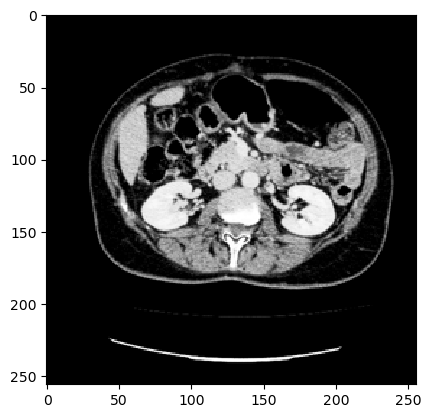

In [255]:
x, y = valid_gen.__getitem__(40)
result = model.predict(x)

result = result > 0.5
print(x.shape, result.shape)

imshow(x[1])

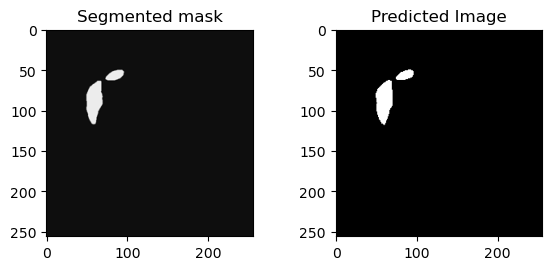

In [256]:
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Add the first subplot with a label
ax = fig.add_subplot(1, 2, 1)
ax.imshow(np.reshape(y[1] * 255, (image_size, image_size)), cmap="gray")
ax.set_title("Segmented mask")  # Add a title to the first subplot

# Add the second subplot with a label
ax = fig.add_subplot(1, 2, 2)
ax.imshow(np.reshape(result[1] * 255, (image_size, image_size)), cmap="gray")
ax.set_title("Predicted Image")  # Add a title to the second subplot

# Show the figure with subplots
plt.show()

1/1 [==============================] - 1s 560ms/step


1/1 [==============================] - 1s 698ms/step


1/1 [==============================] - 1s 538ms/step


/var/folders/w7/y5klds4x3_53168tgqlttv6w0000gn/T/ipykernel_30268/491312399.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(20,20))


1/1 [==============================] - 1s 533ms/step


1/1 [==============================] - 1s 533ms/step


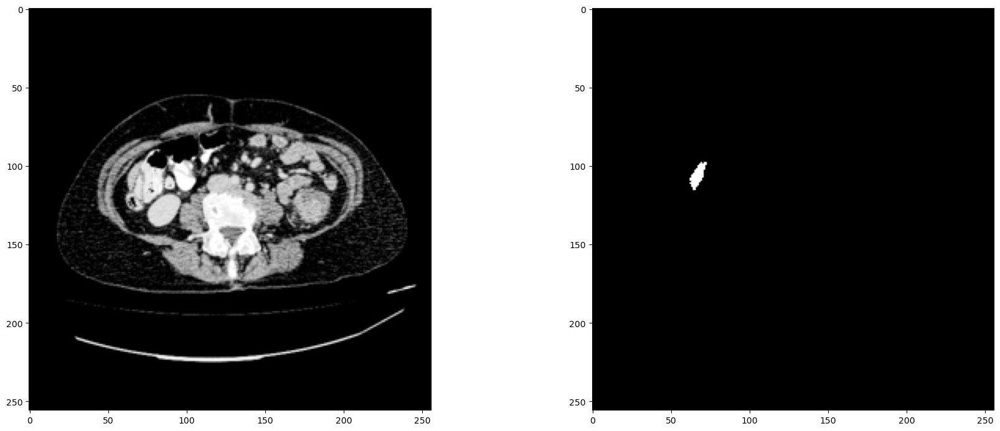

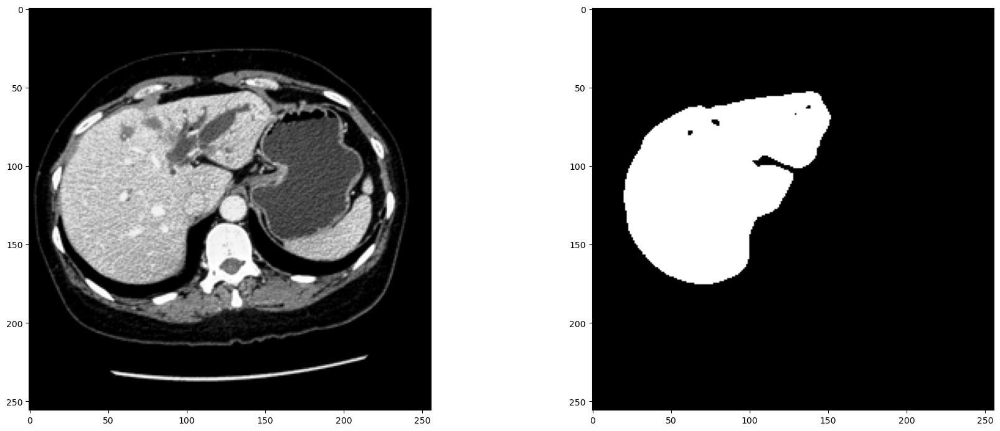

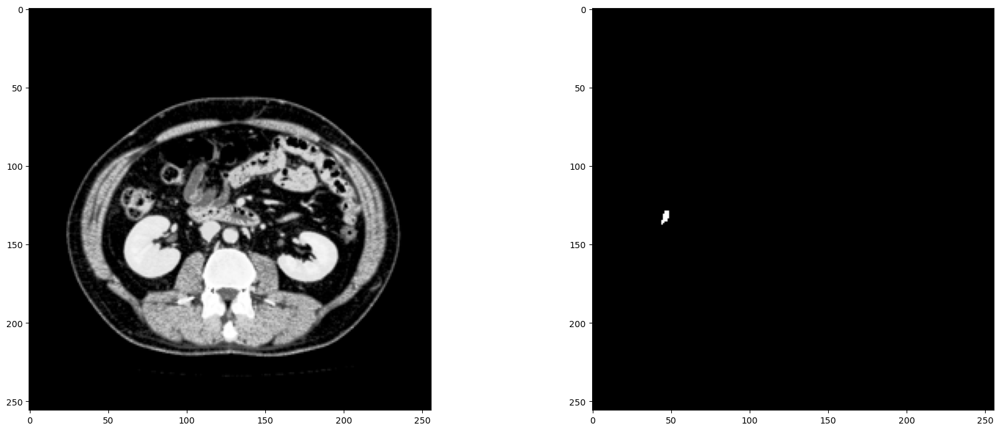

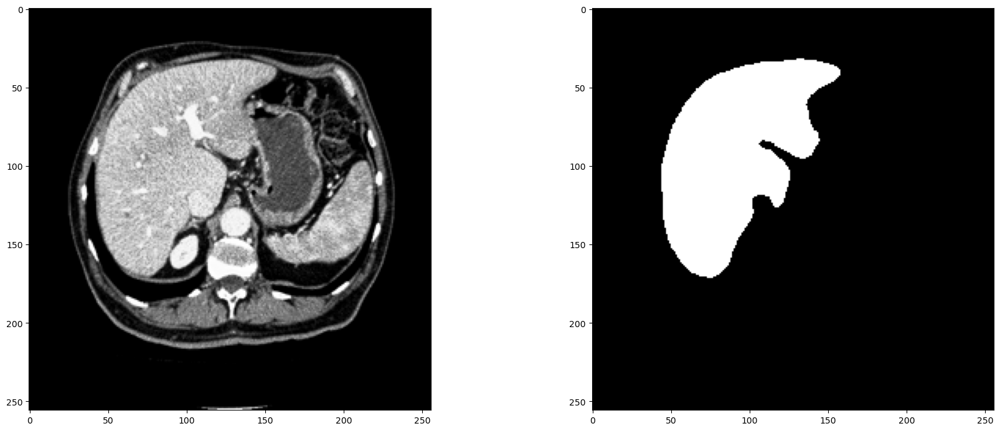

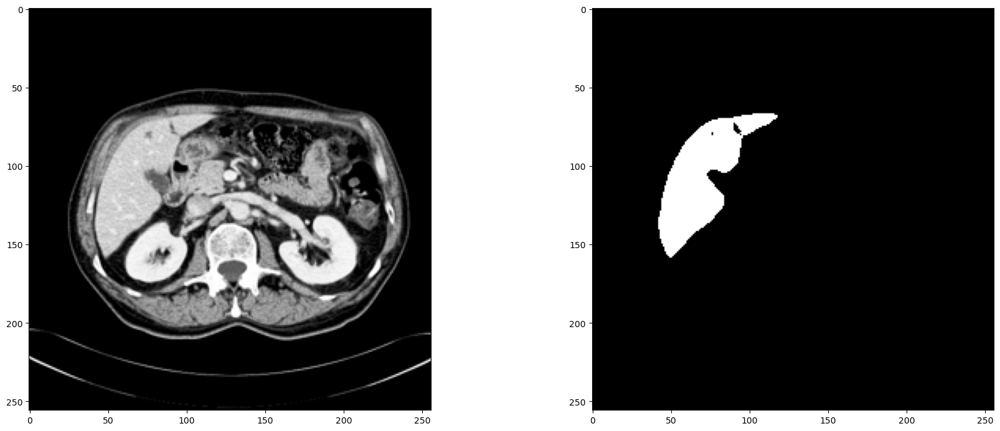

...

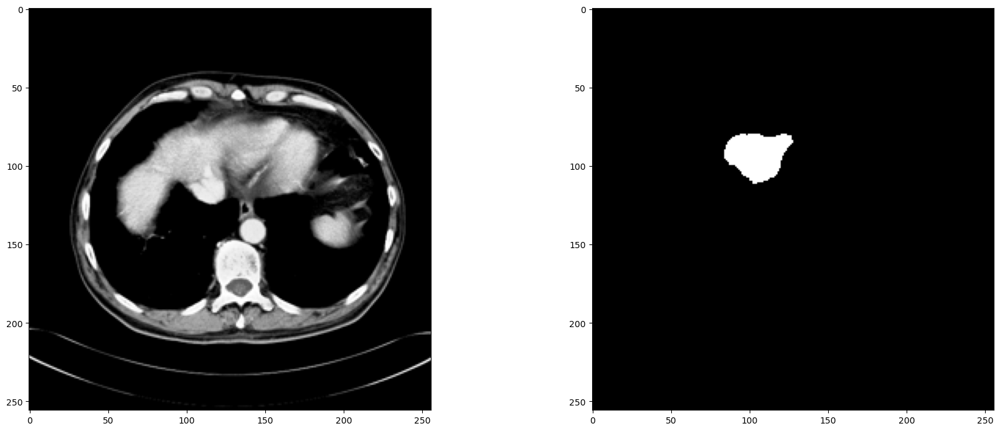

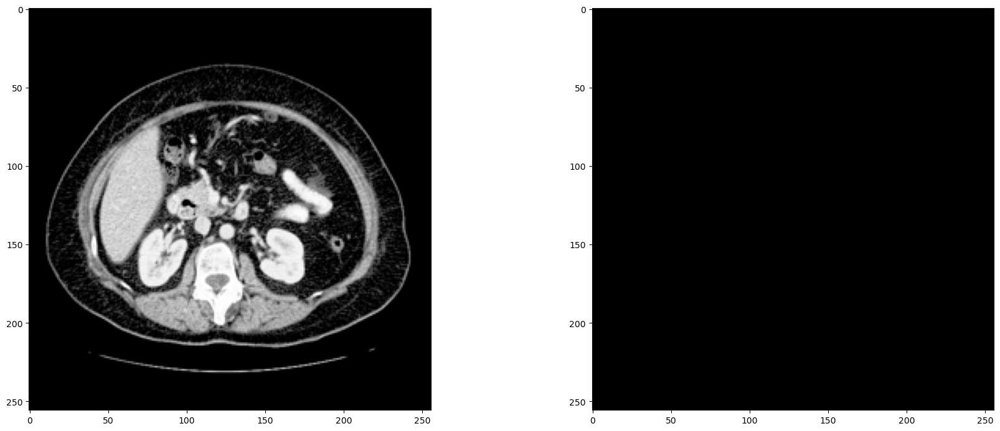

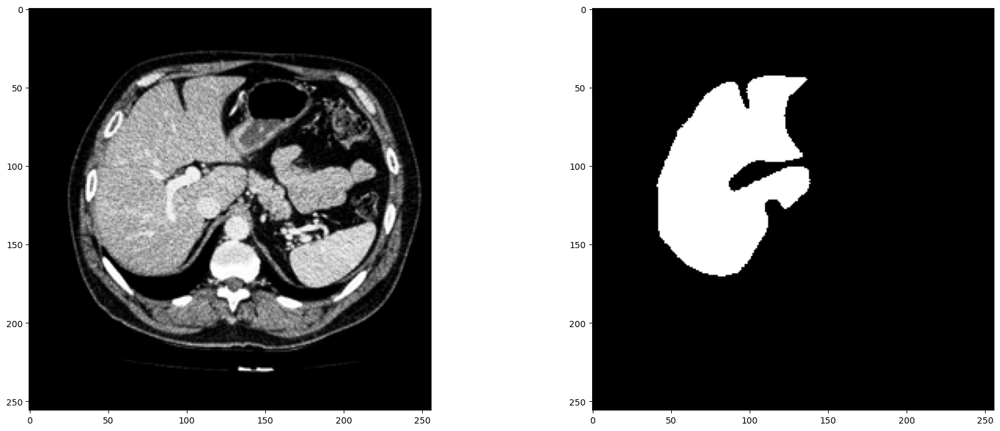

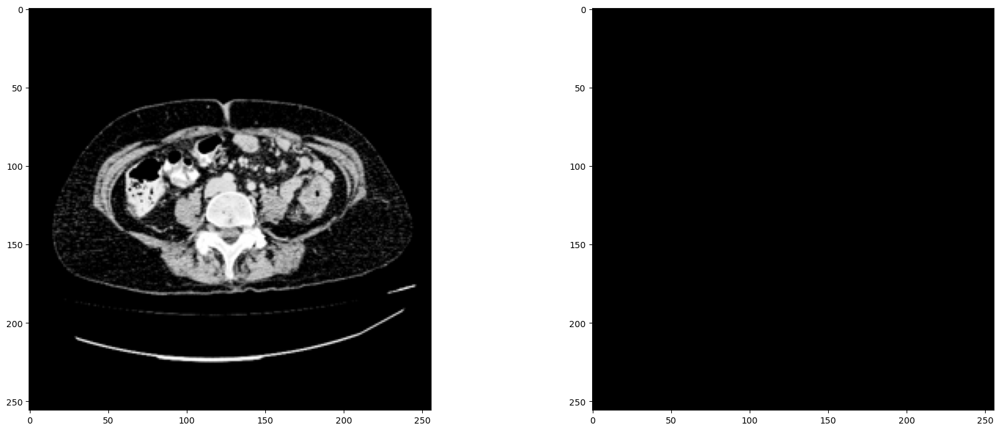

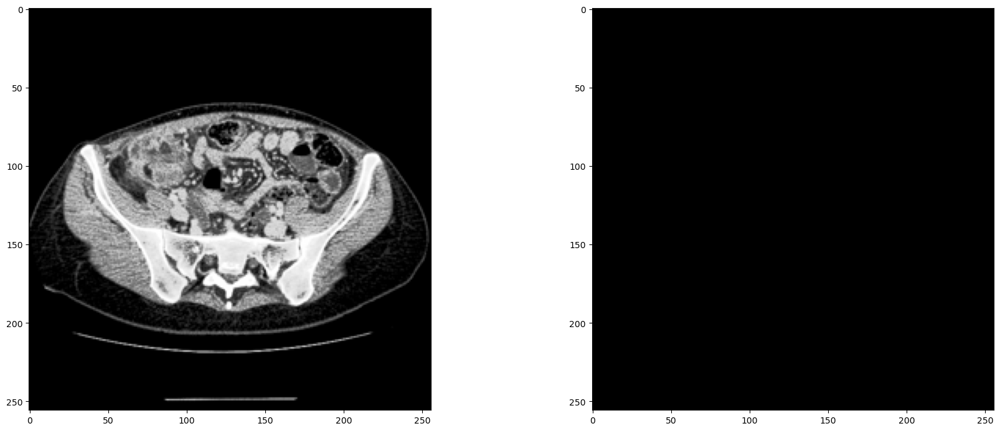

In [257]:
for i in range(15, 20, 1):
    ## Dataset for prediction
    x, y = valid_gen.__getitem__(i)
    result = model.predict(x)
    result = result > 0.5
    
    for i in range(len(result)):
        fig = plt.figure(figsize=(20,20))
        fig.subplots_adjust(hspace=0.4, wspace=0.4)

        ax = fig.add_subplot(1, 2, 1)
        ax.imshow(np.reshape(y[i]*255, (image_size, image_size)), cmap="gray")
        ax.imshow(x[i])
        ax = fig.add_subplot(1, 2, 2)
        ax.imshow(np.reshape(result[i]*255, (image_size, image_size)), cmap="gray")

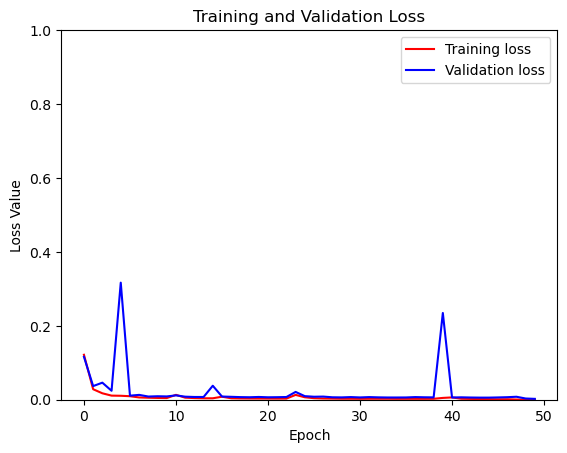

In [258]:
loss = model_history.history['loss']
val_loss = model_history.history['val_loss']

plt.figure()
plt.plot(model_history.epoch, loss, 'r', label='Training loss')
plt.plot(model_history.epoch, val_loss, 'b', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0, 1])
plt.legend()
plt.show()

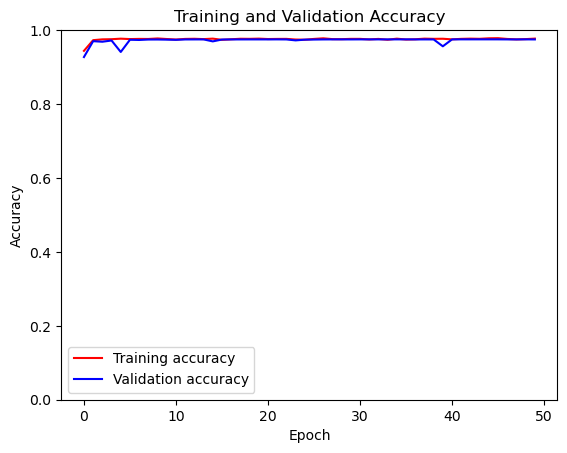

In [251]:
# Access training and validation accuracy values from the 'history' attribute
accuracy = model_history.history['acc']
val_accuracy = model_history.history['val_acc']

plt.figure()
plt.plot(range(len(accuracy)), accuracy, 'r', label='Training accuracy')
plt.plot(range(len(val_accuracy)), val_accuracy, 'b', label='Validation accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
plt.legend()
plt.show()